In [56]:
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'500',
  'convert':'INR'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': 'bc537316-965c-4355-84df-4031d0ae65a1',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)
  

{'status': {'timestamp': '2024-01-31T19:20:50.061Z', 'error_code': 0, 'error_message': None, 'elapsed': 61, 'credit_count': 3, 'notice': None, 'total_count': 8832}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 10806, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'para

In [57]:
type(data)

dict

In [58]:
import pandas as pd


pd.json_normalize(data['status'])

,timestamp,error_code,error_message,elapsed,credit_count,notice,total_count
0,2024-01-31T19:20:50.061Z,0,None,61,3,None,8832


In [59]:


pd.set_option('display.max_columns',None)

In [60]:
df=pd.json_normalize(data['data'])

df['timestamp']=pd.to_datetime('now')

In [61]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.INR.price,quote.INR.volume_24h,quote.INR.volume_change_24h,quote.INR.percent_change_1h,quote.INR.percent_change_24h,quote.INR.percent_change_7d,quote.INR.percent_change_30d,quote.INR.percent_change_60d,quote.INR.percent_change_90d,quote.INR.market_cap,quote.INR.market_cap_dominance,quote.INR.fully_diluted_market_cap,quote.INR.tvl,quote.INR.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10806,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19614193.00000,19614193.00000,False,NaN,1,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,3585435.94900,1950546087830.77100,6.14870,-1.08040,-0.62745,8.59058,-0.03550,10.41046,23.83896,70325432692905.89844,54.11290,75294154929087.57812,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
1,1027,Ethereum,ETH,ethereum,8351,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120182821.04902,120182821.04902,True,NaN,2,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,192419.41240,842854742735.22632,2.15590,-1.12853,-2.33022,4.62750,-0.29213,8.31811,28.17870,23125507807329.50000,17.79420,23125507807329.30078,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
2,825,Tether USDt,USDT,tether,73740,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,96219281549.49486,99600769237.82521,True,NaN,3,NaN,NaN,NaN,2024-01-31T19:05:00.000Z,83.02281,3451384011031.14990,5.24120,-0.02551,-0.03028,0.01979,-0.04381,-0.06405,-0.05978,7988395028401.43652,5.78520,8269135634682.02832,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-01 00:51:04.348549
3,1839,BNB,BNB,bnb,2048,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,149547002.22298,149547002.22298,False,NaN,4,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,25297.39701,64912771211.29677,0.46160,-0.16722,-1.58851,4.15947,-2.07774,32.93617,31.36308,3783149887496.45166,2.91070,3783149887496.45801,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
4,5426,Solana,SOL,solana,623,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,435748129.98010,568382879.81352,True,NaN,5,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,8333.32324,293081811442.50867,10.04180,-1.78653,-4.90902,16.64088,-6.87237,60.39051,150.53864,3631230017829.07422,2.79980,4736518260888.93164,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
5,52,XRP,XRP,xrp,1222,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,54374512255.00000,99987956150.00000,False,NaN,6,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,42.42992,151734784716.26520,60.61880,-0.21640,-1.92628,-0.66945,-18.21561,-17.46552,-16.09210,2307106082466.50977,1.77700,4242991774614.84912,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
6,3408,USDC,USDC,usd-coin,16483,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,26834544392.90236,26834544392.90236,False,NaN,7,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,83.06169,565014167638.79773,28.86240,0.00622,0.02068,0.01577,-0.00333,0.01766,0.00432,2228922547161.81934,1.71770,2228922547161.54541,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-01 00:51:04.348549
7,2010,Cardano,ADA,cardano,1052,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,35423497410.30600,36585743945.10700,False,NaN,8,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,42.63718,38392907664.29579,-10.84870,-0.60469,-0.96632,8.68615,-16.11064,30.98048,56.58741,1510358136314.84814,1.16220,19186

In [62]:
def api_runner():
    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
    parameters = {
    'start':'1',
    'limit':'500',
    'convert':'INR'
    }
    headers = {
      'Accepts': 'application/json',
      'X-CMC_PRO_API_KEY': 'bc537316-965c-4355-84df-4031d0ae65a1',
    }

    session = Session()
    session.headers.update(headers)

    try:
      response = session.get(url, params=parameters)
      data = json.loads(response.text)
      print(data)
    except (ConnectionError, Timeout, TooManyRedirects) as e:
      print(e)
    
    df2=pd.json_normalize(data['data'])

    df2['timestamp']=pd.to_datetime('now')
    
    df_append = pd.DataFrame(df2)
    df = pd.concat([df2,df_append])
    
    if not os.path.isfile(r'C:\Users\DELL\Desktop\Data Analytics\Python\API.csv'):
        df.to_csv(r'C:\Users\DELL\Desktop\Data Analytics\Python\API.csv', header='column_names')
    else:
        df.to_csv(r'C:\Users\DELL\Desktop\Data Analytics\Python\API.csv', mode='a',header=False)

In [64]:
import os

from time import time
from time import sleep

for i in range(333):
    api_runner()
    print("API runner completed")
    sleep(60)
exit()

{'status': {'timestamp': '2024-01-31T19:21:54.669Z', 'error_code': 0, 'error_message': None, 'elapsed': 140, 'credit_count': 3, 'notice': None, 'total_count': 8832}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 10806, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'par

KeyboardInterrupt: 

In [67]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.INR.price,quote.INR.volume_24h,quote.INR.volume_change_24h,quote.INR.percent_change_1h,quote.INR.percent_change_24h,quote.INR.percent_change_7d,quote.INR.percent_change_30d,quote.INR.percent_change_60d,quote.INR.percent_change_90d,quote.INR.market_cap,quote.INR.market_cap_dominance,quote.INR.fully_diluted_market_cap,quote.INR.tvl,quote.INR.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10806,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19614193.00000,19614193.00000,False,NaN,1,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,3585435.94900,1950546087830.77100,6.14870,-1.08040,-0.62745,8.59058,-0.03550,10.41046,23.83896,70325432692905.89844,54.11290,75294154929087.57812,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
1,1027,Ethereum,ETH,ethereum,8351,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120182821.04902,120182821.04902,True,NaN,2,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,192419.41240,842854742735.22632,2.15590,-1.12853,-2.33022,4.62750,-0.29213,8.31811,28.17870,23125507807329.50000,17.79420,23125507807329.30078,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
2,825,Tether USDt,USDT,tether,73740,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,96219281549.49486,99600769237.82521,True,NaN,3,NaN,NaN,NaN,2024-01-31T19:05:00.000Z,83.02281,3451384011031.14990,5.24120,-0.02551,-0.03028,0.01979,-0.04381,-0.06405,-0.05978,7988395028401.43652,5.78520,8269135634682.02832,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-01 00:51:04.348549
3,1839,BNB,BNB,bnb,2048,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,149547002.22298,149547002.22298,False,NaN,4,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,25297.39701,64912771211.29677,0.46160,-0.16722,-1.58851,4.15947,-2.07774,32.93617,31.36308,3783149887496.45166,2.91070,3783149887496.45801,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
4,5426,Solana,SOL,solana,623,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,435748129.98010,568382879.81352,True,NaN,5,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,8333.32324,293081811442.50867,10.04180,-1.78653,-4.90902,16.64088,-6.87237,60.39051,150.53864,3631230017829.07422,2.79980,4736518260888.93164,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
5,52,XRP,XRP,xrp,1222,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,54374512255.00000,99987956150.00000,False,NaN,6,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,42.42992,151734784716.26520,60.61880,-0.21640,-1.92628,-0.66945,-18.21561,-17.46552,-16.09210,2307106082466.50977,1.77700,4242991774614.84912,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
6,3408,USDC,USDC,usd-coin,16483,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,26834544392.90236,26834544392.90236,False,NaN,7,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,83.06169,565014167638.79773,28.86240,0.00622,0.02068,0.01577,-0.00333,0.01766,0.00432,2228922547161.81934,1.71770,2228922547161.54541,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-01 00:51:04.348549
7,2010,Cardano,ADA,cardano,1052,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,35423497410.30600,36585743945.10700,False,NaN,8,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,42.63718,38392907664.29579,-10.84870,-0.60469,-0.96632,8.68615,-16.11064,30.98048,56.58741,1510358136314.84814,1.16220,19186

In [68]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.INR.price,quote.INR.volume_24h,quote.INR.volume_change_24h,quote.INR.percent_change_1h,quote.INR.percent_change_24h,quote.INR.percent_change_7d,quote.INR.percent_change_30d,quote.INR.percent_change_60d,quote.INR.percent_change_90d,quote.INR.market_cap,quote.INR.market_cap_dominance,quote.INR.fully_diluted_market_cap,quote.INR.tvl,quote.INR.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10806,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19614193.00000,19614193.00000,False,NaN,1,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,3585435.94900,1950546087830.77100,6.14870,-1.08040,-0.62745,8.59058,-0.03550,10.41046,23.83896,70325432692905.89844,54.11290,75294154929087.57812,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
1,1027,Ethereum,ETH,ethereum,8351,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120182821.04902,120182821.04902,True,NaN,2,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,192419.41240,842854742735.22632,2.15590,-1.12853,-2.33022,4.62750,-0.29213,8.31811,28.17870,23125507807329.50000,17.79420,23125507807329.30078,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
2,825,Tether USDt,USDT,tether,73740,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,96219281549.49486,99600769237.82521,True,NaN,3,NaN,NaN,NaN,2024-01-31T19:05:00.000Z,83.02281,3451384011031.14990,5.24120,-0.02551,-0.03028,0.01979,-0.04381,-0.06405,-0.05978,7988395028401.43652,5.78520,8269135634682.02832,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-01 00:51:04.348549
3,1839,BNB,BNB,bnb,2048,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,149547002.22298,149547002.22298,False,NaN,4,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,25297.39701,64912771211.29677,0.46160,-0.16722,-1.58851,4.15947,-2.07774,32.93617,31.36308,3783149887496.45166,2.91070,3783149887496.45801,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
4,5426,Solana,SOL,solana,623,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,435748129.98010,568382879.81352,True,NaN,5,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,8333.32324,293081811442.50867,10.04180,-1.78653,-4.90902,16.64088,-6.87237,60.39051,150.53864,3631230017829.07422,2.79980,4736518260888.93164,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
5,52,XRP,XRP,xrp,1222,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,54374512255.00000,99987956150.00000,False,NaN,6,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,42.42992,151734784716.26520,60.61880,-0.21640,-1.92628,-0.66945,-18.21561,-17.46552,-16.09210,2307106082466.50977,1.77700,4242991774614.84912,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
6,3408,USDC,USDC,usd-coin,16483,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,26834544392.90236,26834544392.90236,False,NaN,7,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,83.06169,565014167638.79773,28.86240,0.00622,0.02068,0.01577,-0.00333,0.01766,0.00432,2228922547161.81934,1.71770,2228922547161.54541,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-01 00:51:04.348549
7,2010,Cardano,ADA,cardano,1052,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,35423497410.30600,36585743945.10700,False,NaN,8,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,42.63718,38392907664.29579,-10.84870,-0.60469,-0.96632,8.68615,-16.11064,30.98048,56.58741,1510358136314.84814,1.16220,19186

In [69]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.INR.price,quote.INR.volume_24h,quote.INR.volume_change_24h,quote.INR.percent_change_1h,quote.INR.percent_change_24h,quote.INR.percent_change_7d,quote.INR.percent_change_30d,quote.INR.percent_change_60d,quote.INR.percent_change_90d,quote.INR.market_cap,quote.INR.market_cap_dominance,quote.INR.fully_diluted_market_cap,quote.INR.tvl,quote.INR.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10806,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19614193.00000,19614193.00000,False,NaN,1,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,3585435.94900,1950546087830.77100,6.14870,-1.08040,-0.62745,8.59058,-0.03550,10.41046,23.83896,70325432692905.89844,54.11290,75294154929087.57812,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
1,1027,Ethereum,ETH,ethereum,8351,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120182821.04902,120182821.04902,True,NaN,2,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,192419.41240,842854742735.22632,2.15590,-1.12853,-2.33022,4.62750,-0.29213,8.31811,28.17870,23125507807329.50000,17.79420,23125507807329.30078,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
2,825,Tether USDt,USDT,tether,73740,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,96219281549.49486,99600769237.82521,True,NaN,3,NaN,NaN,NaN,2024-01-31T19:05:00.000Z,83.02281,3451384011031.14990,5.24120,-0.02551,-0.03028,0.01979,-0.04381,-0.06405,-0.05978,7988395028401.43652,5.78520,8269135634682.02832,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-01 00:51:04.348549
3,1839,BNB,BNB,bnb,2048,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,149547002.22298,149547002.22298,False,NaN,4,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,25297.39701,64912771211.29677,0.46160,-0.16722,-1.58851,4.15947,-2.07774,32.93617,31.36308,3783149887496.45166,2.91070,3783149887496.45801,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
4,5426,Solana,SOL,solana,623,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,435748129.98010,568382879.81352,True,NaN,5,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,8333.32324,293081811442.50867,10.04180,-1.78653,-4.90902,16.64088,-6.87237,60.39051,150.53864,3631230017829.07422,2.79980,4736518260888.93164,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
5,52,XRP,XRP,xrp,1222,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,54374512255.00000,99987956150.00000,False,NaN,6,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,42.42992,151734784716.26520,60.61880,-0.21640,-1.92628,-0.66945,-18.21561,-17.46552,-16.09210,2307106082466.50977,1.77700,4242991774614.84912,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
6,3408,USDC,USDC,usd-coin,16483,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,26834544392.90236,26834544392.90236,False,NaN,7,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,83.06169,565014167638.79773,28.86240,0.00622,0.02068,0.01577,-0.00333,0.01766,0.00432,2228922547161.81934,1.71770,2228922547161.54541,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-01 00:51:04.348549
7,2010,Cardano,ADA,cardano,1052,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,35423497410.30600,36585743945.10700,False,NaN,8,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,42.63718,38392907664.29579,-10.84870,-0.60469,-0.96632,8.68615,-16.11064,30.98048,56.58741,1510358136314.84814,1.16220,19186

In [70]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [71]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.INR.price,quote.INR.volume_24h,quote.INR.volume_change_24h,quote.INR.percent_change_1h,quote.INR.percent_change_24h,quote.INR.percent_change_7d,quote.INR.percent_change_30d,quote.INR.percent_change_60d,quote.INR.percent_change_90d,quote.INR.market_cap,quote.INR.market_cap_dominance,quote.INR.fully_diluted_market_cap,quote.INR.tvl,quote.INR.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10806,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19614193.00000,19614193.00000,False,NaN,1,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,3585435.94900,1950546087830.77100,6.14870,-1.08040,-0.62745,8.59058,-0.03550,10.41046,23.83896,70325432692905.89844,54.11290,75294154929087.57812,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
1,1027,Ethereum,ETH,ethereum,8351,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120182821.04902,120182821.04902,True,NaN,2,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,192419.41240,842854742735.22632,2.15590,-1.12853,-2.33022,4.62750,-0.29213,8.31811,28.17870,23125507807329.50000,17.79420,23125507807329.30078,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
2,825,Tether USDt,USDT,tether,73740,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,96219281549.49486,99600769237.82521,True,NaN,3,NaN,NaN,NaN,2024-01-31T19:05:00.000Z,83.02281,3451384011031.14990,5.24120,-0.02551,-0.03028,0.01979,-0.04381,-0.06405,-0.05978,7988395028401.43652,5.78520,8269135634682.02832,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-01 00:51:04.348549
3,1839,BNB,BNB,bnb,2048,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,149547002.22298,149547002.22298,False,NaN,4,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,25297.39701,64912771211.29677,0.46160,-0.16722,-1.58851,4.15947,-2.07774,32.93617,31.36308,3783149887496.45166,2.91070,3783149887496.45801,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
4,5426,Solana,SOL,solana,623,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,435748129.98010,568382879.81352,True,NaN,5,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,8333.32324,293081811442.50867,10.04180,-1.78653,-4.90902,16.64088,-6.87237,60.39051,150.53864,3631230017829.07422,2.79980,4736518260888.93164,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
5,52,XRP,XRP,xrp,1222,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,54374512255.00000,99987956150.00000,False,NaN,6,NaN,NaN,NaN,2024-01-31T19:20:00.000Z,42.42992,151734784716.26520,60.61880,-0.21640,-1.92628,-0.66945,-18.21561,-17.46552,-16.09210,2307106082466.50977,1.77700,4242991774614.84912,NaN,2024-01-31T19:19:05.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-01 00:51:04.348549
6,3408,USDC,USDC,usd-coin,16483,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,26834544392.90236,26834544392.90236,False,NaN,7,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,83.06169,565014167638.79773,28.86240,0.00622,0.02068,0.01577,-0.00333,0.01766,0.00432,2228922547161.81934,1.71770,2228922547161.54541,NaN,2024-01-31T19:19:05.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-01 00:51:04.348549
7,2010,Cardano,ADA,cardano,1052,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,35423497410.30600,36585743945.10700,False,NaN,8,NaN,NaN,NaN,2024-01-31T19:19:00.000Z,42.63718,38392907664.29579,-10.84870,-0.60469,-0.96632,8.68615,-16.11064,30.98048,56.58741,1510358136314.84814,1.16220,19186

In [93]:
df3=df.groupby(by='name',sort=False)[['quote.INR.percent_change_1h','quote.INR.percent_change_24h','quote.INR.percent_change_7d','quote.INR.percent_change_30d','quote.INR.percent_change_60d','quote.INR.percent_change_90d']].mean()


In [94]:
df3

,quote.INR.percent_change_1h,quote.INR.percent_change_24h,quote.INR.percent_change_7d,quote.INR.percent_change_30d,quote.INR.percent_change_60d,quote.INR.percent_change_90d
name,,,,,,
Bitcoin,-1.08040,-0.62745,8.59058,-0.03550,10.41046,23.83896
Ethereum,-1.12853,-2.33022,4.62750,-0.29213,8.31811,28.17870
Tether USDt,-0.02551,-0.03028,0.01979,-0.04381,-0.06405,-0.05978
BNB,-0.16722,-1.58851,4.15947,-2.07774,32.93617,31.36308
Solana,-1.78653,-4.90902,16.64088,-6.87237,60.39051,150.53864
XRP,-0.21640,-1.92628,-0.66945,-18.21561,-17.46552,-16.09210
USDC,0.00622,0.02068,0.01577,-0.00333,0.01766,0.00432
Cardano,-0.60469,-0.96632,8.68615,-16.11064,30.98048,56.58741
Avalanche,-0.88822,-3.16383,14.31121,-13.82782,57.50373,197.83842


In [95]:
df4=df3.stack()
df4

name                                                                              
Bitcoin                                               quote.INR.percent_change_1h      -1.08040
                                                      quote.INR.percent_change_24h     -0.62745
                                                      quote.INR.percent_change_7d       8.59058
                                                      quote.INR.percent_change_30d     -0.03550
                                                      quote.INR.percent_change_60d     10.41046
                                                      quote.INR.percent_change_90d     23.83896
Ethereum                                              quote.INR.percent_change_1h      -1.12853
                                                      quote.INR.percent_change_24h     -2.33022
                                                      quote.INR.percent_change_7d       4.62750
                                                     

In [96]:
df5=df4.to_frame(name='values')
df5

values
name                                                                                      
Bitcoin                                            quote.INR.percent_change_1h    -1.08040
                                                   quote.INR.percent_change_24h   -0.62745
                                                   quote.INR.percent_change_7d     8.59058
                                                   quote.INR.percent_change_30d   -0.03550
                                                   quote.INR.percent_change_60d   10.41046
                                                   quote.INR.percent_change_90d   23.83896
Ethereum                                           quote.INR.percent_change_1h    -1.12853
                                                   quote.INR.percent_change_24h   -2.33022
                                                   quote.INR.percent_change_7d     4.62750
                                                   quote.INR.percent_change_30d   -0.29213
                                                   quote.INR.percent_change_60d    8.31811
                                                   quote.INR.percent_change_90d   28.17870
Tether USDt                                        quote.INR.percent_change_1h    -0.02551
                                                   quote.INR.percent_change_24h   -0.03028
                                                   quote.INR.percent_change_7d     0.01979
                                                   quote.INR.percent_change_30d   -0.04381
                                                   quote.INR.percent_change_60d   -0.06405
                                                   quote.INR.percent_change_90d   -0.05978
BNB                                                quote.INR.percent_change_1h    -0.16722
                                                   quote.INR.percent_change_24h   -1.58851
                                                   quote.INR.percent_change_7d     4.15947
                                                   quote.INR.percent_change_30d   -2.07774
                                                   quote.INR.percent_change_60d   32.93617
                                                   quote.INR.percent_change_90d   31.36308
Solana                                             quote.INR.percent_change_1h    -1.78653
                                                   quote.INR.percent_change_24h   -4.90902
                                                   quote.INR.percent_change_7d    16.64088
                                                   quote.INR.percent_change_30d   -6.87237
                                                   quote.INR.percent_change_60d   60.39051
                                                   quote.INR.percent_change_90d  150.53864
XRP                                                quote.INR.percent_change_1h    -0.21640
                                                   quote.INR.percent_change_24h   -1.92628
                                                   quote.INR.percent_change_7d    -0.66945
                                                   quote.INR.percent_change_30d  -18.21561
                                                   quote.INR.percent_change_60d  -17.46552
                                                   quote.INR.percent_change_90d  -16.09210
USDC                                               quote.INR.percent_change_1h     0.00622
                                                   quote.INR.percent_change_24h    0.02068
                                                   quote.INR.percent_change_7d     0.01577
                                                   quote.INR.percent_change_30d   -0.00333
                                                   quote.INR.percent_change_60d    0.01766
                                                   quote.INR.percent_change_90d    0.00432
Cardano                                            quote.INR.percent_change_1h  

In [97]:
type(df5)

pandas.core.frame.DataFrame

In [98]:
df5.count()

values    3000
dtype: int64

In [99]:
index = pd.Index(range(3000))

df6 = df5.reset_index()

df6

,name,level_1,values
0,Bitcoin,quote.INR.percent_change_1h,-1.08040
1,Bitcoin,quote.INR.percent_change_24h,-0.62745
2,Bitcoin,quote.INR.percent_change_7d,8.59058
3,Bitcoin,quote.INR.percent_change_30d,-0.03550
4,Bitcoin,quote.INR.percent_change_60d,10.41046
5,Bitcoin,quote.INR.percent_change_90d,23.83896
6,Ethereum,quote.INR.percent_change_1h,-1.12853
7,Ethereum,quote.INR.percent_change_24h,-2.33022
8,Ethereum,quote.INR.percent_change_7d,4.62750
9,Ethereum,quote.INR.percent_change_30d,-0.29213


In [100]:
df7 = df6.rename(columns={'level_1': 'Percentage_change'})

df7

,name,Percentage_change,values
0,Bitcoin,quote.INR.percent_change_1h,-1.08040
1,Bitcoin,quote.INR.percent_change_24h,-0.62745
2,Bitcoin,quote.INR.percent_change_7d,8.59058
3,Bitcoin,quote.INR.percent_change_30d,-0.03550
4,Bitcoin,quote.INR.percent_change_60d,10.41046
5,Bitcoin,quote.INR.percent_change_90d,23.83896
6,Ethereum,quote.INR.percent_change_1h,-1.12853
7,Ethereum,quote.INR.percent_change_24h,-2.33022
8,Ethereum,quote.INR.percent_change_7d,4.62750
9,Ethereum,quote.INR.percent_change_30d,-0.29213


In [109]:
df7['Percentage_change']=df7['Percentage_change'].replace(['quote.INR.percent_change_1h','quote.INR.percent_change_24h','quote.INR.percent_change_7d','quote.INR.percent_change_30d','quote.INR.percent_change_60d','quote.INR.percent_change_90d'],['1hr','24hr','7d','30d','60d','90d'])
df7

,name,Percentage_change,values
0,Bitcoin,1hr,-1.08040
1,Bitcoin,24hr,-0.62745
2,Bitcoin,7d,8.59058
3,Bitcoin,30d,-0.03550
4,Bitcoin,60d,10.41046
5,Bitcoin,90d,23.83896
6,Ethereum,1hr,-1.12853
7,Ethereum,24hr,-2.33022
8,Ethereum,7d,4.62750
9,Ethereum,30d,-0.29213


In [110]:
import seaborn as sns
import matplotlib.pyplot as plt

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


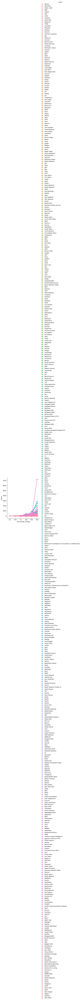

In [111]:
sns.catplot(x='Percentage_change',y='values',hue='name',data=df7,kind='point')